In [68]:
from os.path import expanduser
import numpy as np
import pandas as pd
import rasters as rt
from rasters import Raster
import sklearn.linear_model
from GEOS5FP import GEOS5FP
from ECOSTRESS.L2_LSTE import L2TLSTE
from ECOSTRESS.L2_STARS import L2TSTARS
from model import check_distribution
import logging
import colored_logging as cl
logger = logging.getLogger(__name__)

In [2]:
L2T_LSTE_filename = "/Users/halverso/Desktop/L2T_L3T_L4TDAG.15801.013.11RPQ.0700.20210419T215859000/ECOv002_L2T_LSTE_15801_013_11RPQ_20210419T215859_0700_01.zip"
L2T_STARS_filename = "/Users/halverso/Desktop/L2T_L3T_L4TDAG.15801.013.11RPQ.0700.20210419T215859000/L2T_STARS_Task/ECOv002_L2T_STARS_15801_013_11RPQ_20210419_0700_01.zip"
working_directory = "/Users/halverso/data/ECOSTRESS_test_runs/15801_013"
GEOS5FP_directory = "/Users/halverso/data/ECOSTRESS_test_runs/15801_013/L3T_L4T_JET_sources/GEOS5FP_download"
upsampling = "average"
downsampling = "linear"
GEOS_IN_SENTINEL_COARSE_CELL_SIZE = 13720

In [69]:
def NDVI_to_FVC(NDVI: Raster) -> Raster:
    NDVIv = 0.52  # +- 0.03
    NDVIs = 0.04  # +- 0.03
    FVC = rt.clip((NDVI - NDVIs) / (NDVIv - NDVIs), 0, 1)

    return FVC

In [3]:
GEOS5FP_connection = GEOS5FP(
    working_directory=working_directory,
    download_directory=GEOS5FP_directory
)

GEOS5FP_connection

[2022-06-15 16:18:50 INFO] GEOS-5 FP working directory: /Users/halverso/data/ECOSTRESS_test_runs/15801_013
[2022-06-15 16:18:50 INFO] GEOS-5 FP download directory: /Users/halverso/data/ECOSTRESS_test_runs/15801_013/L3T_L4T_JET_sources/GEOS5FP_download
[2022-06-15 16:18:50 INFO] GEOS-5 FP products directory: /Users/halverso/data/ECOSTRESS_test_runs/15801_013/GEOS5FP_products


{
  "URL": "https://portal.nccs.nasa.gov/datashare/gmao/geos-fp/das",
  "download_directory": "/Users/halverso/data/ECOSTRESS_test_runs/15801_013/L3T_L4T_JET_sources/GEOS5FP_download",
  "products_directory": "/Users/halverso/data/ECOSTRESS_test_runs/15801_013/GEOS5FP_products"
}

In [4]:
L2T_LSTE_granule = L2TLSTE(L2T_LSTE_filename)
L2T_STARS_granule = L2TSTARS(L2T_STARS_filename)
L2T_LSTE_granule    

L2TLSTE("/Users/halverso/Desktop/L2T_L3T_L4TDAG.15801.013.11RPQ.0700.20210419T215859000/ECOv002_L2T_LSTE_15801_013_11RPQ_20210419T215859_0700_01.zip")

In [5]:
time_UTC = L2T_LSTE_granule.time_UTC
time_UTC

datetime.datetime(2021, 4, 19, 21, 58, 59)

In [25]:
date_UTC = L2T_LSTE_granule.date_UTC
date_UTC

datetime.date(2021, 4, 19)

In [26]:
tile = L2T_LSTE_granule.tile
tile

'11RPQ'

In [6]:
geometry = L2T_LSTE_granule.geometry
geometry

{
  "dimensions": {
    "rows": 1568,
    "cols": 1568
  },
  "bbox": {
    "xmin": 600000.0,
    "ymin": 3390280.0,
    "xmax": 709760.0,
    "ymax": 3500040.0
  },
  "crs": "EPSG:32611",
  "resolution": {
    "cell_width": 70.0,
    "cell_height": -70.0
  }
}

In [45]:
coarse_geometry = geometry.rescale(GEOS_IN_SENTINEL_COARSE_CELL_SIZE)
coarse_geometry

{
  "dimensions": {
    "rows": 8,
    "cols": 8
  },
  "bbox": {
    "xmin": 600000.0,
    "ymin": 3390280.0,
    "xmax": 709760.0,
    "ymax": 3500040.0
  },
  "crs": "EPSG:32611",
  "resolution": {
    "cell_width": 13720.0,
    "cell_height": -13720.0
  }
}

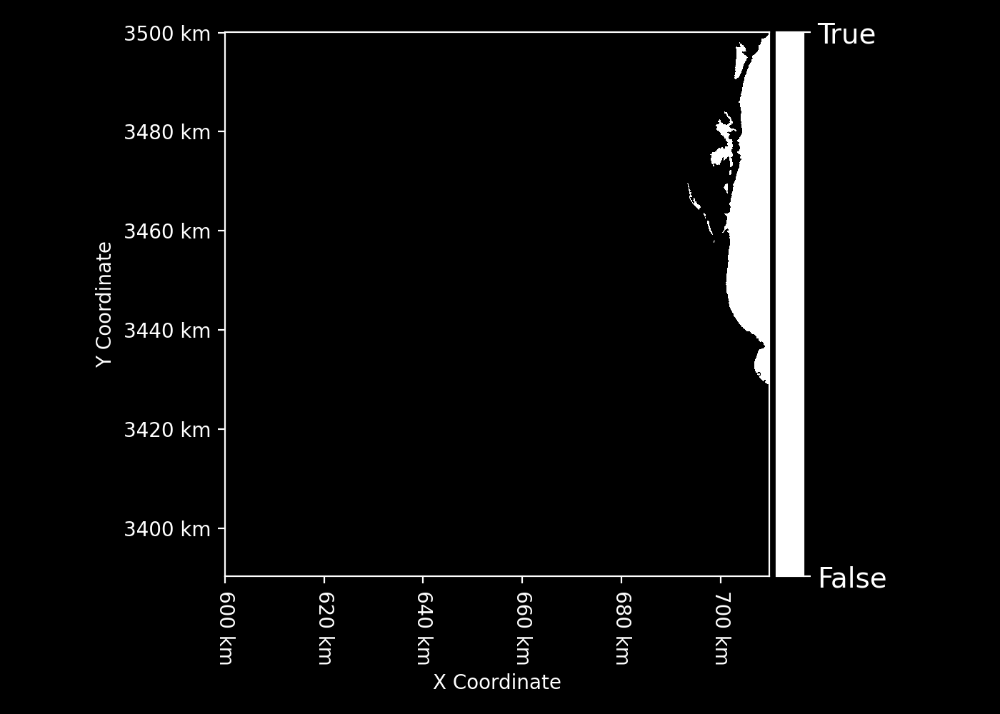

In [46]:
water = L2T_LSTE_granule.water
water

In [48]:
coarse_water = water.to_geometry(coarse_geometry)
coarse_water

TypeError: int() argument must be a string, a bytes-like object or a number, not 'NoneType'

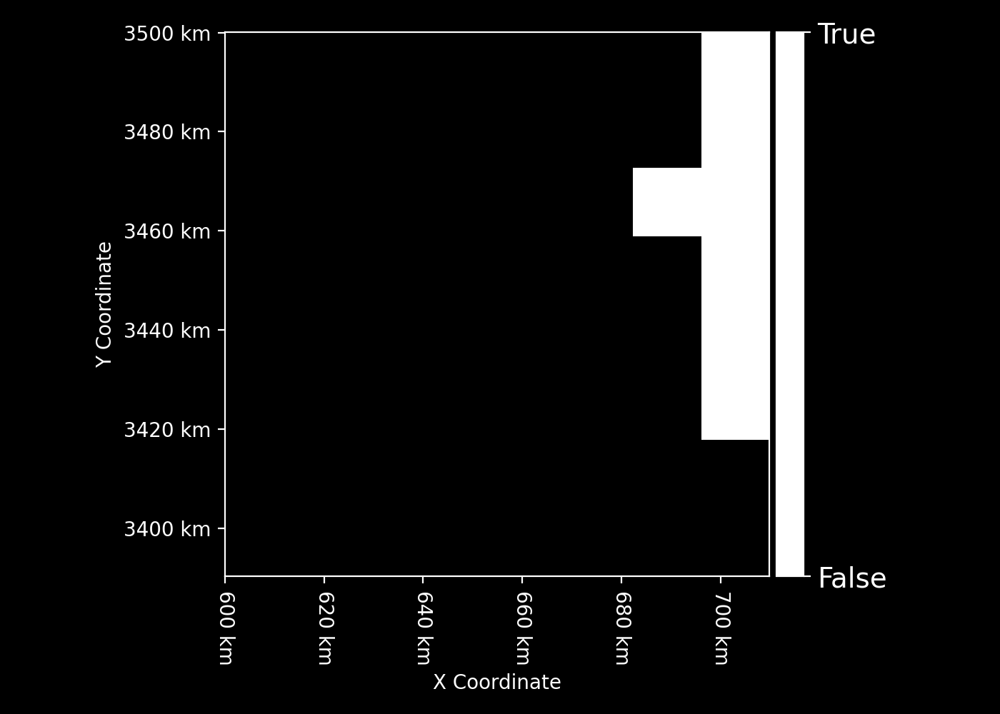

In [60]:
coarse_water = water.astype(np.uint16).to_geometry(coarse_geometry, resampling="max").astype(bool)
coarse_water

[2022-06-15 16:18:51 INFO] started reading L2T_LSTE LST: zip:///Users/halverso/Desktop/L2T_L3T_L4TDAG.15801.013.11RPQ.0700.20210419T215859000/ECOv002_L2T_LSTE_15801_013_11RPQ_20210419T215859_0700_01.zip!/ECOv002_L2T_LSTE_15801_013_11RPQ_20210419T215859_0700_01/ECOv002_L2T_LSTE_15801_013_11RPQ_20210419T215859_0700_01_LST.tif
[2022-06-15 16:18:51 INFO] finished reading L2T_LSTE LST (0.03s)


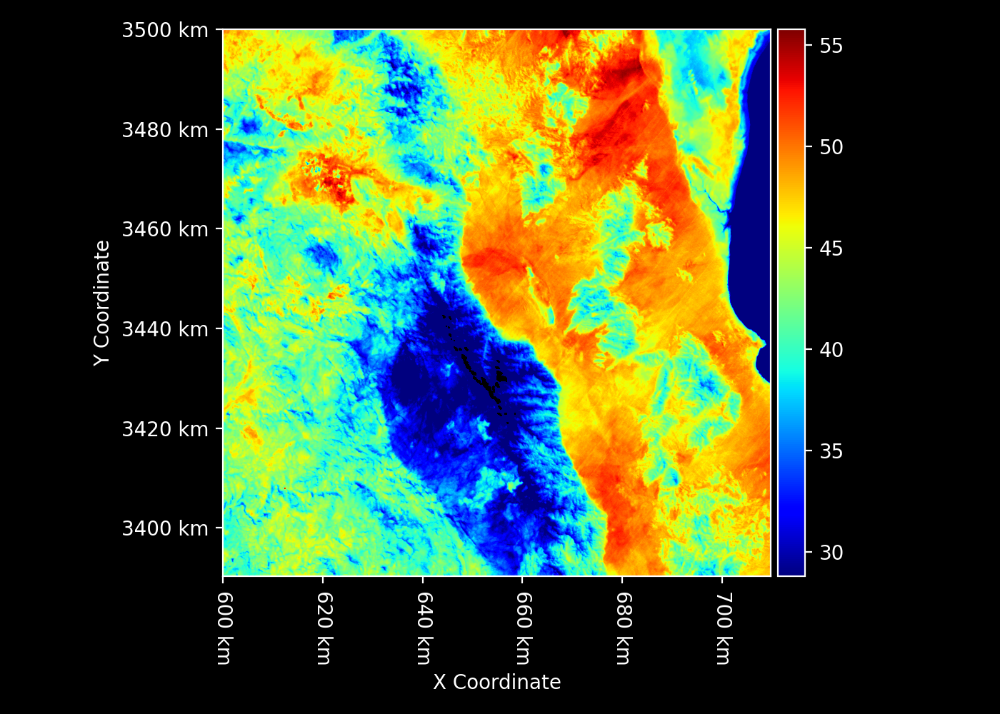

In [9]:
ST_C = L2T_LSTE_granule.ST_C
ST_C

[2022-06-15 16:18:51 INFO] started reading L2T_STARS NDVI: zip:///Users/halverso/Desktop/L2T_L3T_L4TDAG.15801.013.11RPQ.0700.20210419T215859000/L2T_STARS_Task/ECOv002_L2T_STARS_15801_013_11RPQ_20210419_0700_01.zip!/ECOv002_L2T_STARS_15801_013_11RPQ_20210419_0700_01/ECOv002_L2T_STARS_15801_013_11RPQ_20210419_0700_01_NDVI.tif
[2022-06-15 16:18:51 INFO] finished reading L2T_STARS NDVI (0.04s)


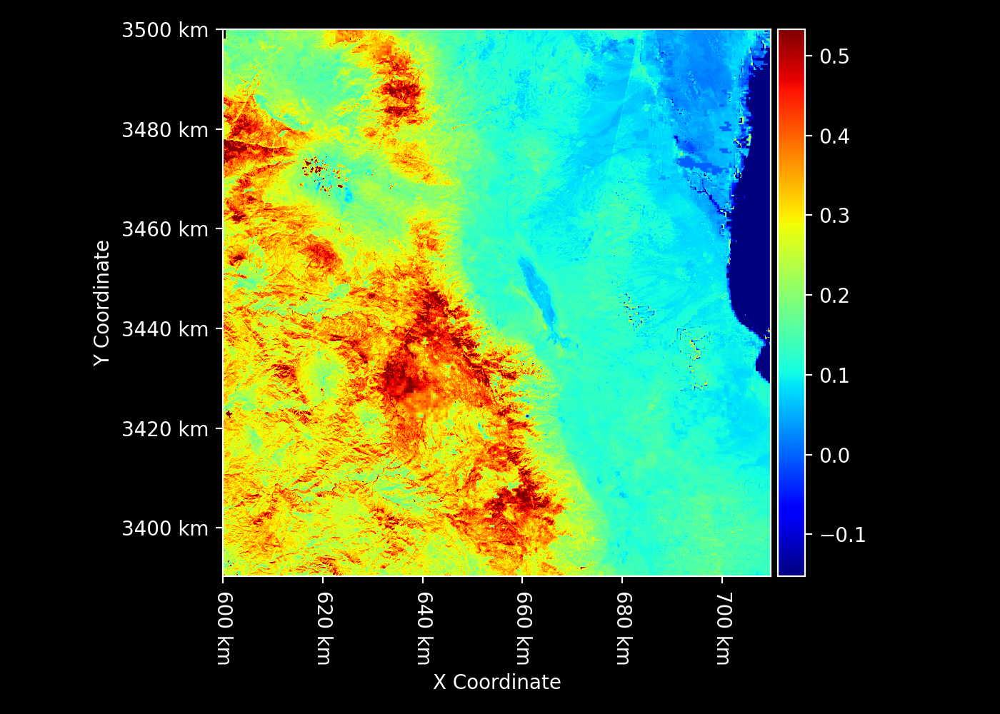

In [10]:
NDVI = L2T_STARS_granule.NDVI
NDVI

[2022-06-15 16:18:52 INFO] started reading L2T_STARS albedo: zip:///Users/halverso/Desktop/L2T_L3T_L4TDAG.15801.013.11RPQ.0700.20210419T215859000/L2T_STARS_Task/ECOv002_L2T_STARS_15801_013_11RPQ_20210419_0700_01.zip!/ECOv002_L2T_STARS_15801_013_11RPQ_20210419_0700_01/ECOv002_L2T_STARS_15801_013_11RPQ_20210419_0700_01_albedo.tif
[2022-06-15 16:18:52 INFO] finished reading L2T_STARS albedo (0.04s)


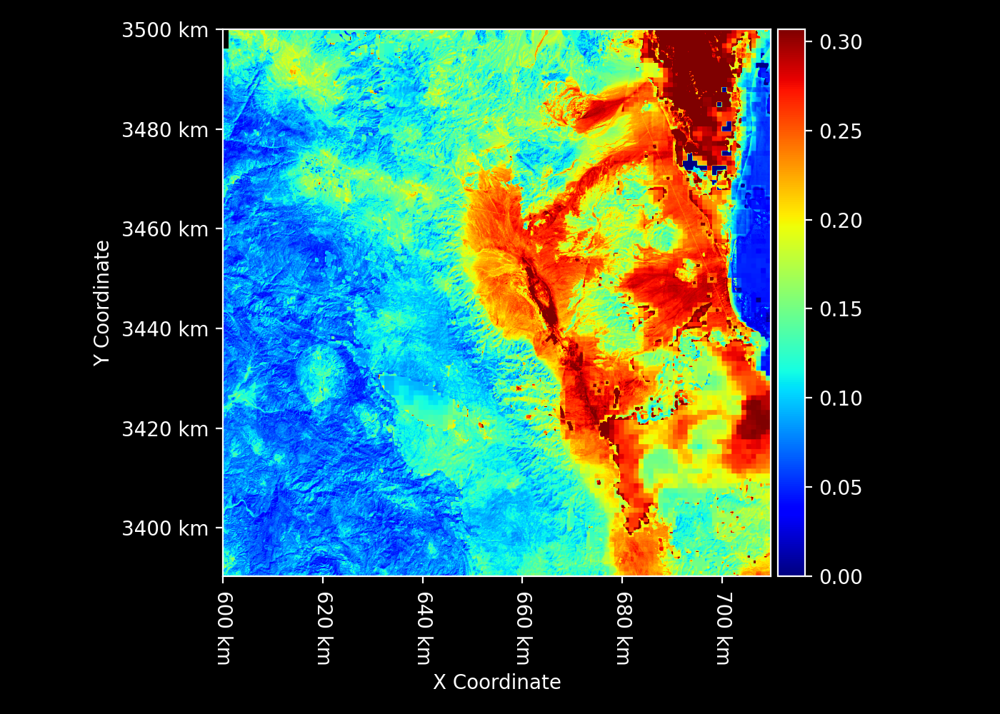

In [11]:
albedo = L2T_STARS_granule.albedo
albedo

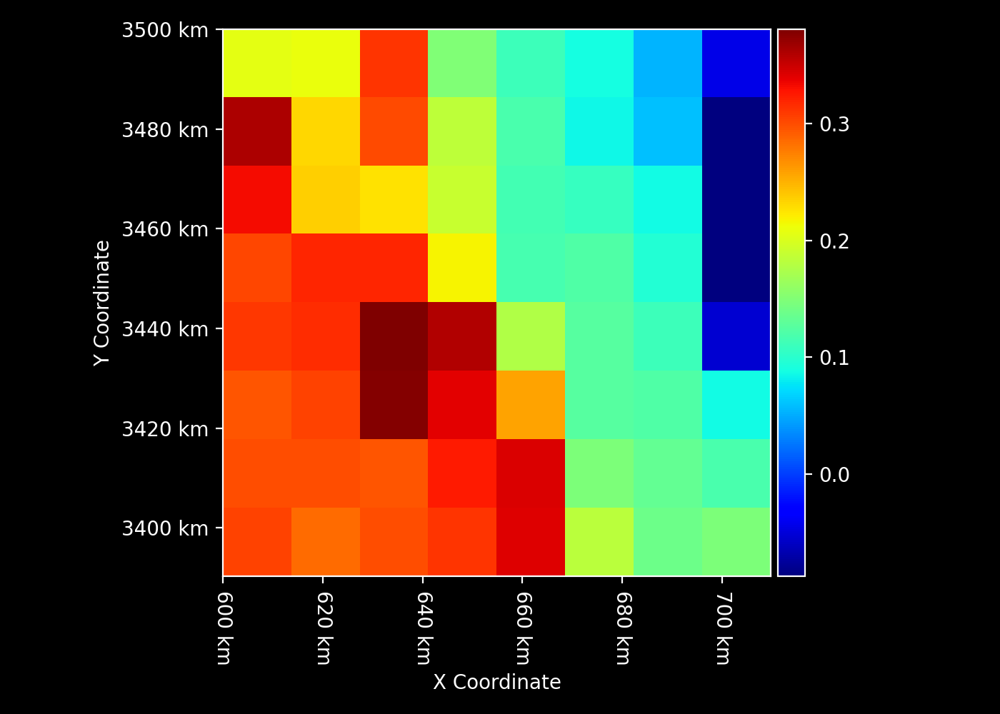

In [12]:
NDVI_coarse = NDVI.to_geometry(coarse_geometry, resampling=upsampling)
NDVI_coarse

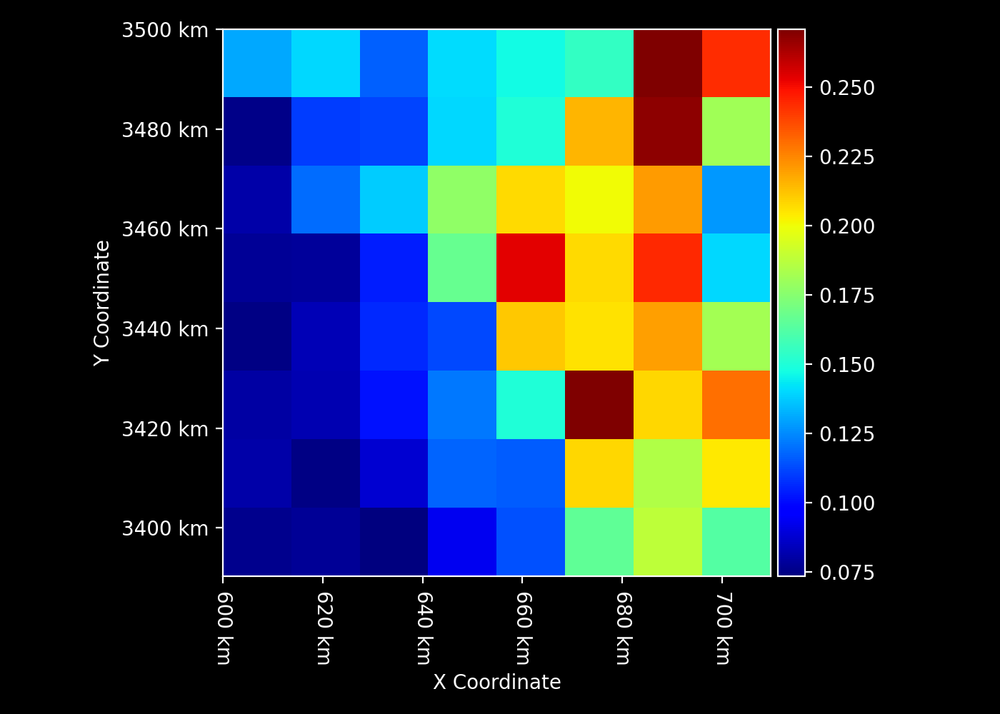

In [13]:
albedo_coarse = albedo.to_geometry(coarse_geometry, resampling=upsampling)
albedo_coarse

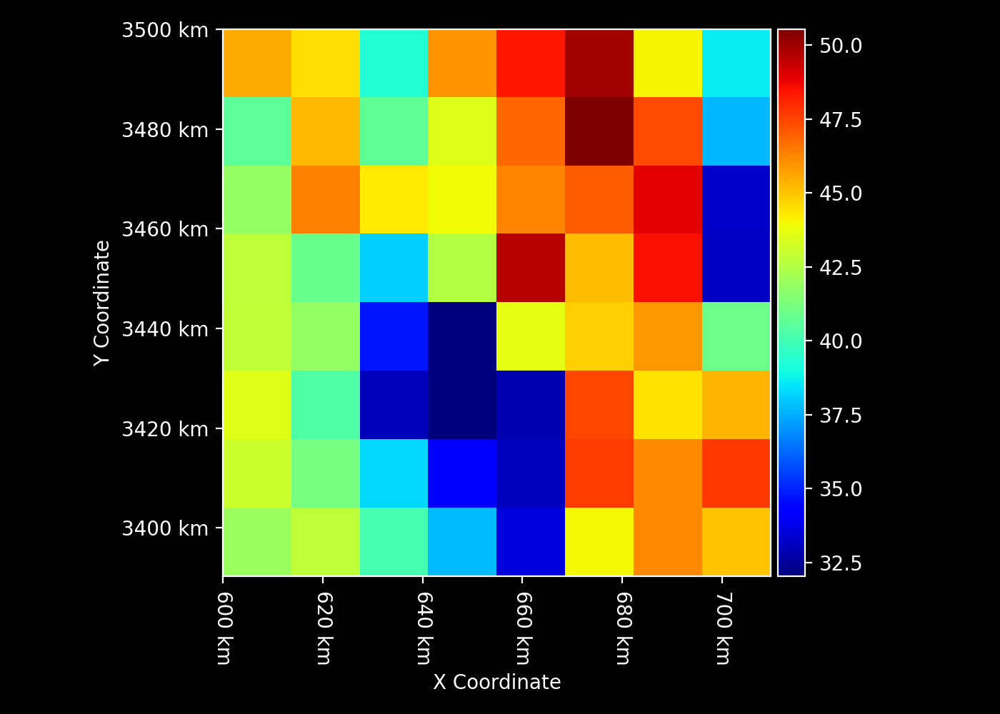

In [14]:
ST_C_coarse = ST_C.to_geometry(coarse_geometry, resampling=upsampling)
ST_C_coarse

[2022-06-15 16:18:53 INFO] retrieving Ta from GEOS-5 FP tavg1_2d_slv_Nx T2M for 2021-04-19 21:58 UTC
[2022-06-15 16:18:53 INFO] searching GEOS-5 FP tavg1_2d_slv_Nx at 2021-04-19 21:58:59 UTC
[2022-06-15 16:18:54 INFO] GEOS-5 FP file found: /Users/halverso/data/ECOSTRESS_test_runs/15801_013/L3T_L4T_JET_sources/GEOS5FP_download/2021.04.19/GEOS.fp.asm.tavg1_2d_slv_Nx.20210419_2130.V01.nc4
[2022-06-15 16:18:54 INFO] GEOS-5 FP working directory: /Users/halverso/data/ECOSTRESS_test_runs/15801_013
[2022-06-15 16:18:54 INFO] GEOS-5 FP products directory: /Users/halverso/data/ECOSTRESS_test_runs/15801_013/GEOS5FP_products
[2022-06-15 16:18:54 INFO] GEOS-5 FP file found: /Users/halverso/data/ECOSTRESS_test_runs/15801_013/L3T_L4T_JET_sources/GEOS5FP_download/2021.04.19/GEOS.fp.asm.tavg1_2d_slv_Nx.20210419_2230.V01.nc4
[2022-06-15 16:18:54 INFO] GEOS-5 FP working directory: /Users/halverso/data/ECOSTRESS_test_runs/15801_013
[2022-06-15 16:18:54 INFO] GEOS-5 FP products directory: /Users/halverso/d

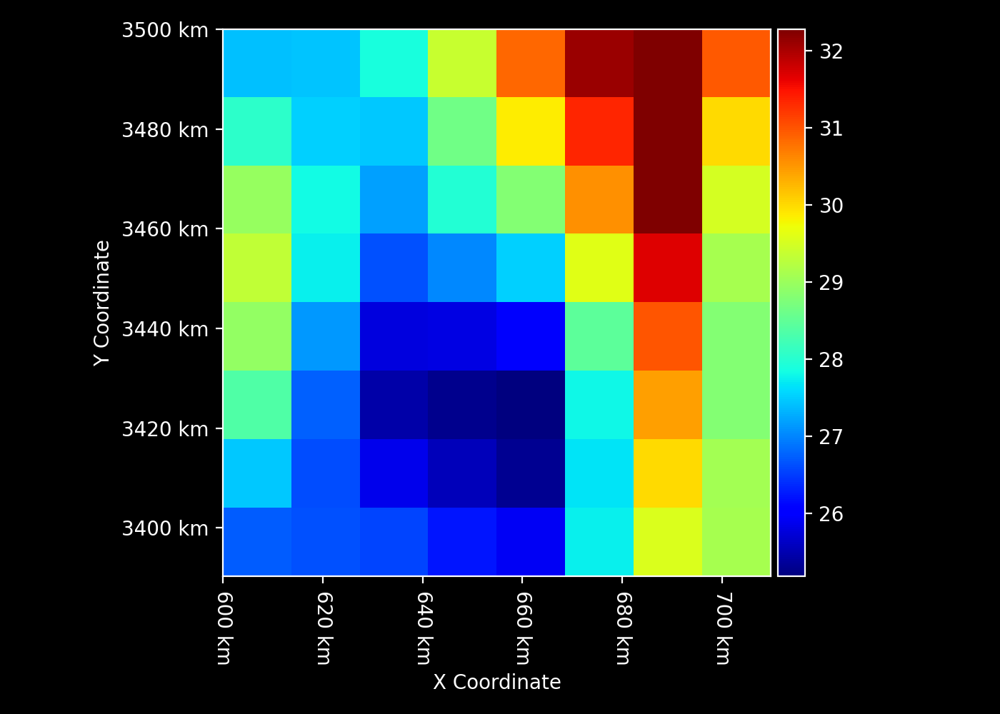

In [15]:
Ta_C_coarse = GEOS5FP_connection.Ta_C(time_UTC=time_UTC, geometry=coarse_geometry, resampling=downsampling)
Ta_C_coarse

[2022-06-15 16:18:55 INFO] retrieving Ta from GEOS-5 FP tavg1_2d_slv_Nx T2M for 2021-04-19 21:58 UTC
[2022-06-15 16:18:55 INFO] searching GEOS-5 FP tavg1_2d_slv_Nx at 2021-04-19 21:58:59 UTC
[2022-06-15 16:18:55 INFO] GEOS-5 FP file found: /Users/halverso/data/ECOSTRESS_test_runs/15801_013/L3T_L4T_JET_sources/GEOS5FP_download/2021.04.19/GEOS.fp.asm.tavg1_2d_slv_Nx.20210419_2130.V01.nc4
[2022-06-15 16:18:55 INFO] GEOS-5 FP working directory: /Users/halverso/data/ECOSTRESS_test_runs/15801_013
[2022-06-15 16:18:55 INFO] GEOS-5 FP products directory: /Users/halverso/data/ECOSTRESS_test_runs/15801_013/GEOS5FP_products
[2022-06-15 16:18:56 INFO] GEOS-5 FP file found: /Users/halverso/data/ECOSTRESS_test_runs/15801_013/L3T_L4T_JET_sources/GEOS5FP_download/2021.04.19/GEOS.fp.asm.tavg1_2d_slv_Nx.20210419_2230.V01.nc4
[2022-06-15 16:18:56 INFO] GEOS-5 FP working directory: /Users/halverso/data/ECOSTRESS_test_runs/15801_013
[2022-06-15 16:18:56 INFO] GEOS-5 FP products directory: /Users/halverso/d

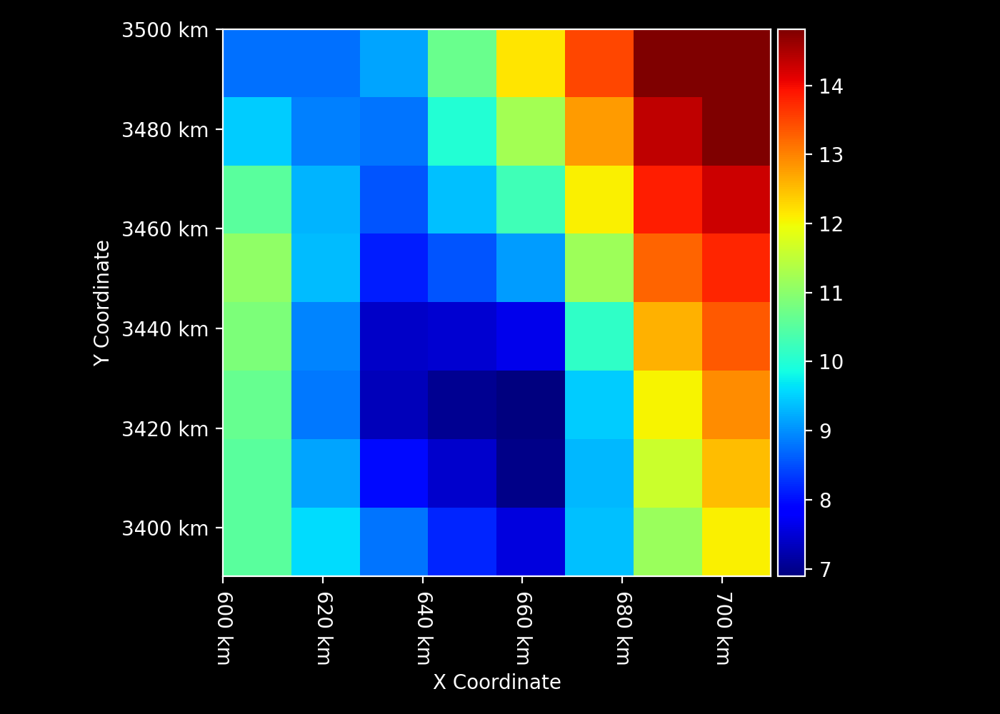

In [16]:
Td_C_coarse = GEOS5FP_connection.Td_C(time_UTC=time_UTC, geometry=coarse_geometry, resampling=downsampling)
Td_C_coarse

[2022-06-15 16:18:59 INFO] retrieving top layer soil moisture from GEOS-5 FP tavg1_2d_lnd_Nx SFMC for 2021-04-19 21:58 UTC
[2022-06-15 16:18:59 INFO] searching GEOS-5 FP tavg1_2d_lnd_Nx at 2021-04-19 21:58:59 UTC
[2022-06-15 16:19:00 INFO] GEOS-5 FP file found: /Users/halverso/data/ECOSTRESS_test_runs/15801_013/L3T_L4T_JET_sources/GEOS5FP_download/2021.04.19/GEOS.fp.asm.tavg1_2d_lnd_Nx.20210419_2130.V01.nc4
[2022-06-15 16:19:00 INFO] GEOS-5 FP working directory: /Users/halverso/data/ECOSTRESS_test_runs/15801_013
[2022-06-15 16:19:00 INFO] GEOS-5 FP products directory: /Users/halverso/data/ECOSTRESS_test_runs/15801_013/GEOS5FP_products
[2022-06-15 16:19:00 INFO] GEOS-5 FP file found: /Users/halverso/data/ECOSTRESS_test_runs/15801_013/L3T_L4T_JET_sources/GEOS5FP_download/2021.04.19/GEOS.fp.asm.tavg1_2d_lnd_Nx.20210419_2230.V01.nc4
[2022-06-15 16:19:00 INFO] GEOS-5 FP working directory: /Users/halverso/data/ECOSTRESS_test_runs/15801_013
[2022-06-15 16:19:00 INFO] GEOS-5 FP products direct

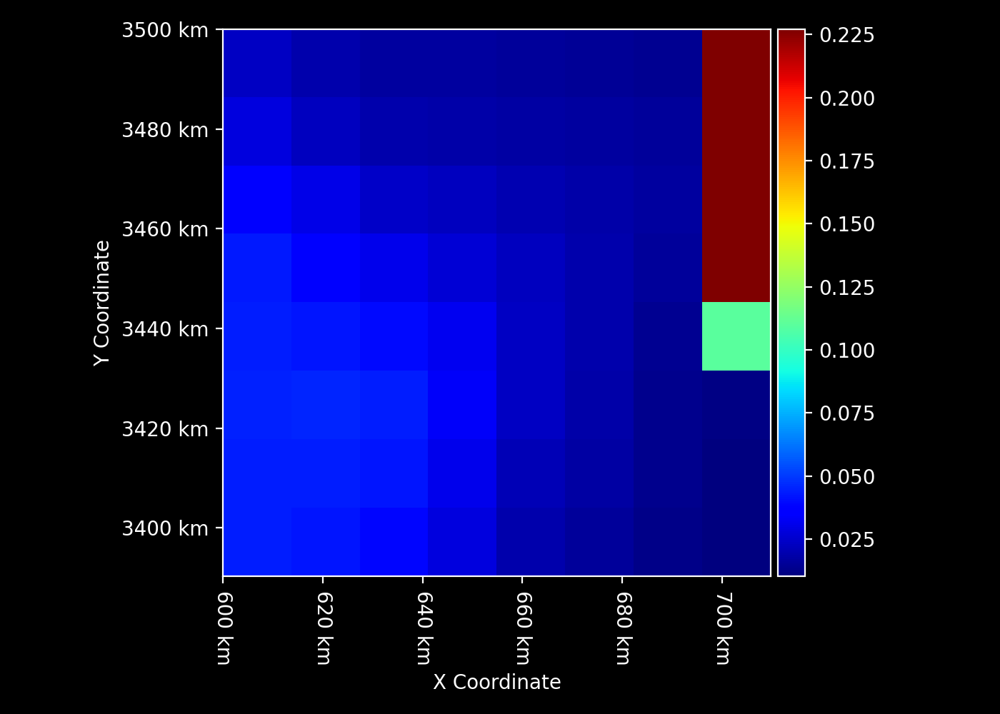

In [17]:
SM_coarse = GEOS5FP_connection.SM(time_UTC=time_UTC, geometry=coarse_geometry, resampling=downsampling)
SM_coarse

In [18]:
coarse_samples = pd.DataFrame({
    "Ta_C": np.array(Ta_C_coarse).ravel(),
    "Td_C": np.array(Td_C_coarse).ravel(),
    "SM": np.array(SM_coarse).ravel(),
    "ST_C": np.array(ST_C_coarse).ravel(),
    "NDVI": np.array(NDVI_coarse).ravel(),
    "albedo": np.array(albedo_coarse).ravel()
})

coarse_samples = coarse_samples.dropna()
coarse_samples

,Ta_C,Td_C,SM,ST_C,NDVI,albedo
0,27.424927,8.751709,0.023039,45.502678,0.206126,0.131281
1,27.447418,8.758118,0.019316,44.501896,0.209133,0.139982
2,27.872986,9.174713,0.016507,39.311192,0.312994,0.117340
3,29.376709,10.687653,0.016238,45.943661,0.148692,0.141322
4,30.846344,12.170349,0.015938,48.438976,0.110750,0.147096
...,...,...,...,...,...,...
59,26.221313,8.162781,0.028836,37.785973,0.312207,0.092879
60,25.920044,7.558655,0.019424,33.554710,0.340923,0.113655
61,27.741241,9.372284,0.016127,44.015392,0.182798,0.165420
62,29.537933,11.154419,0.012822,46.197021,0.138600,0.187844


In [19]:
Ta_C_model = sklearn.linear_model.LinearRegression()
Ta_C_model.fit(coarse_samples[["ST_C", "NDVI", "albedo"]], coarse_samples["Ta_C"])
Ta_C_intercept = Ta_C_model.intercept_
ST_C_Ta_C_coef, NDVI_Ta_C_coef, albedo_Ta_C_coef = Ta_C_model.coef_
Ta_C_intercept, ST_C_Ta_C_coef, NDVI_Ta_C_coef, albedo_Ta_C_coef

(21.774311, 0.17240793, -6.617539, 3.4319556)

[2022-06-15 16:29:52 INFO] air temperature regression: Ta_C = 21.77 + 0.17 * ST_C + -6.62 * NDVI + 3.43 * albedo
[2022-06-15 16:29:52 INFO] variable Ta_C_prediction on 2021-04-19 at 11RPQ min: 19.928 mean: 28.324 max: 39.729 nan: 0.10% (nan)
[2022-06-15 16:29:52 INFO] up-sampling predicted air temperature from 70m to 13720m with average method
[2022-06-15 16:29:52 INFO] variable Ta_C_prediction_coarse on 2021-04-19 at 11RPQ min: 24.989 mean: 28.322 max: 30.663 nan: 0.00% (nan)
[2022-06-15 16:29:52 INFO] variable Ta_C_bias_coarse on 2021-04-19 at 11RPQ min: -3.274 mean: 0.000 max: 2.915 nan: 0.00% (nan)
[2022-06-15 16:29:52 INFO] down-sampling air temperature bias from 13720m to 70m with linear method
[2022-06-15 16:29:53 INFO] variable Ta_C_bias_smooth on 2021-04-19 at 11RPQ min: -3.270 mean: 0.000 max: 2.910 nan: 0.00% (nan)
[2022-06-15 16:29:53 INFO] bias-correcting air temperature
[2022-06-15 16:29:53 INFO] variable Ta_C on 2021-04-19 at 11RPQ min: 19.387 mean: 28.324 max: 41.107 na

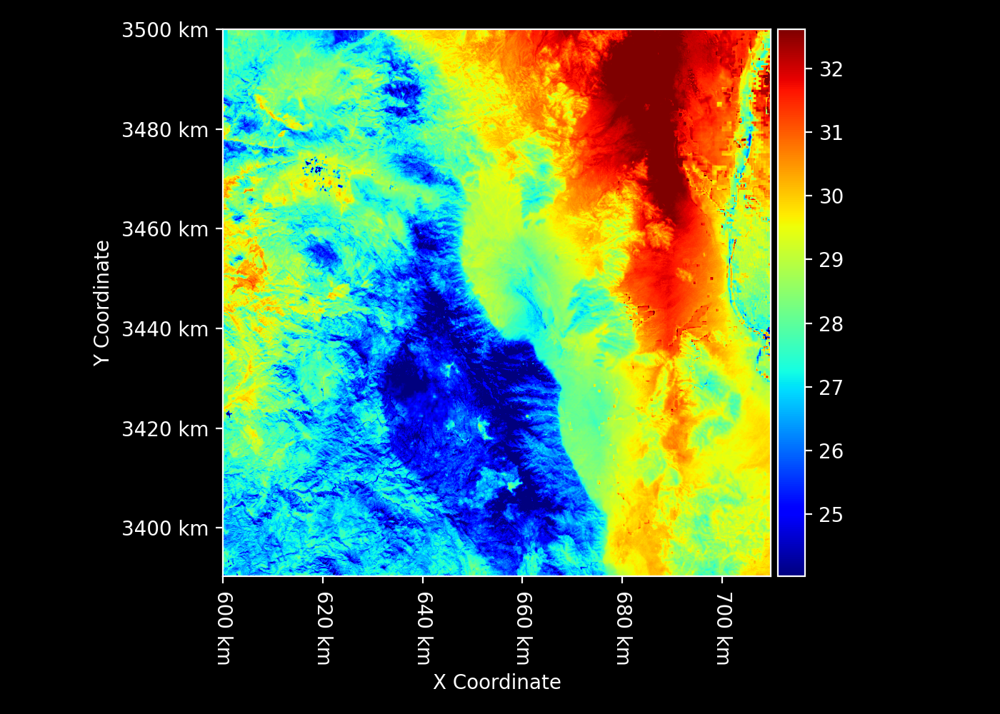

In [31]:

logger.info(f"air temperature regression: Ta_C = {Ta_C_intercept:0.2f} + {ST_C_Ta_C_coef:0.2f} * ST_C + {NDVI_Ta_C_coef:0.2f} * NDVI + {albedo_Ta_C_coef:0.2f} * albedo")
Ta_C_prediction = ST_C * ST_C_Ta_C_coef + NDVI * NDVI_Ta_C_coef + albedo * albedo_Ta_C_coef + Ta_C_intercept
check_distribution(Ta_C_prediction, "Ta_C_prediction", date_UTC, tile)
logger.info(f"up-sampling predicted air temperature from {int(Ta_C_prediction.cell_size)}m to {int(coarse_geometry.cell_size)}m with {upsampling} method")
Ta_C_prediction_coarse = Ta_C_prediction.to_geometry(coarse_geometry, resampling=upsampling)
check_distribution(Ta_C_prediction_coarse, "Ta_C_prediction_coarse", date_UTC, tile)
Ta_C_bias_coarse = Ta_C_prediction_coarse - Ta_C_coarse
check_distribution(Ta_C_bias_coarse, "Ta_C_bias_coarse", date_UTC, tile)
logger.info(f"down-sampling air temperature bias from {int(Ta_C_bias_coarse.cell_size)}m to {int(geometry.cell_size)}m with {downsampling} method")
Ta_C_bias_smooth = Ta_C_bias_coarse.to_geometry(geometry, resampling=downsampling)
check_distribution(Ta_C_bias_smooth, "Ta_C_bias_smooth", date_UTC, tile)
logger.info("bias-correcting air temperature")
Ta_C = Ta_C_prediction - Ta_C_bias_smooth
check_distribution(Ta_C, "Ta_C", date_UTC, tile)
Ta_C_smooth = GEOS5FP_connection.Ta_C(time_UTC=time_UTC, geometry=geometry, resampling=downsampling)
check_distribution(Ta_C_smooth, "Ta_C_smooth", date_UTC, tile)
logger.info("gap-filling air temperature")
Ta_C = rt.where(np.isnan(Ta_C), Ta_C_smooth, Ta_C)
check_distribution(Ta_C, "Ta_C", date_UTC, tile)
logger.info(f"up-sampling final air temperature from {int(Ta_C.cell_size)}m to {int(coarse_geometry.cell_size)}m with {upsampling} method")
Ta_C_final_coarse = Ta_C.to_geometry(coarse_geometry, resampling=upsampling)
check_distribution(Ta_C_final_coarse, "Ta_C_final_coarse", date_UTC, tile)
Ta_C_error_coarse = Ta_C_final_coarse - Ta_C_coarse
check_distribution(Ta_C_error_coarse, "Ta_C_error_coarse", date_UTC, tile)
logger.info(f"down-sampling air temperature error from {int(Ta_C_error_coarse.cell_size)}m to {int(geometry.cell_size)}m with {downsampling} method")
Ta_C_error = Ta_C_error_coarse.to_geometry(geometry, resampling=downsampling)
check_distribution(Ta_C_error, "Ta_C_error", date_UTC, tile)
Ta_C

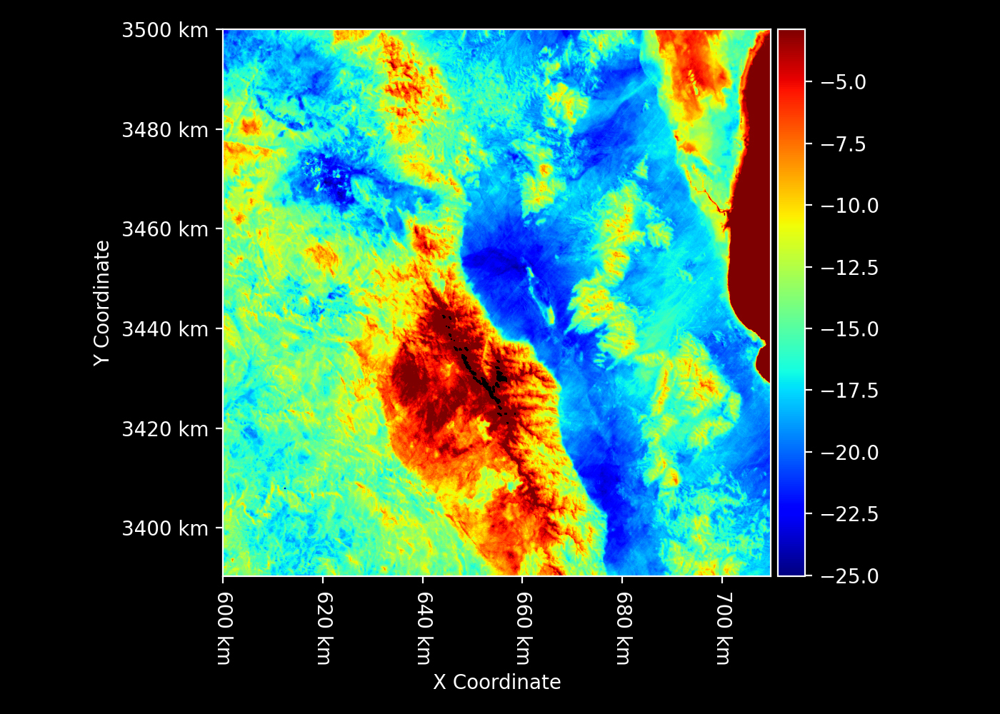

In [32]:
Ta_C - ST_C

In [22]:
Td_C_model = sklearn.linear_model.LinearRegression()
Td_C_model.fit(coarse_samples[["ST_C", "NDVI", "albedo"]], coarse_samples["Td_C"])
Td_C_intercept = Td_C_model.intercept_
ST_C_Td_C_coef, NDVI_Td_C_coef, albedo_Td_C_coef = Td_C_model.coef_
Td_C_intercept, ST_C_Td_C_coef, NDVI_Td_C_coef, albedo_Td_C_coef

(8.334591, 0.11463652, -12.5502205, -2.961165)

[2022-06-15 16:35:44 INFO] dew-point temperature regression: Td_C = 8.33 + 0.11 * ST_C + -12.55 * NDVI + -2.96 * albedo
[2022-06-15 16:35:44 INFO] variable Td_C_prediction on 2021-04-19 at 11RPQ min: -2.120 mean: 10.349 max: 25.613 nan: 0.10% (nan)
[2022-06-15 16:35:44 INFO] up-sampling predicted dew-point temperature from 70m to 13720m with average method
[2022-06-15 16:35:44 INFO] variable Td_C_prediction_coarse on 2021-04-19 at 11RPQ min: 6.953 mean: 10.347 max: 14.971 nan: 0.00% (nan)
[2022-06-15 16:35:44 INFO] variable Td_C_bias_coarse on 2021-04-19 at 11RPQ min: -3.084 mean: 0.000 max: 2.868 nan: 0.00% (nan)
[2022-06-15 16:35:44 INFO] down-sampling dew-point temperature bias from 13720m to 70m with linear method
[2022-06-15 16:35:44 INFO] variable Td_C_bias_smooth on 2021-04-19 at 11RPQ min: -3.082 mean: 0.000 max: 2.864 nan: 0.00% (nan)
[2022-06-15 16:35:44 INFO] bias-correcting dew-point temperature
[2022-06-15 16:35:44 INFO] variable Td_C on 2021-04-19 at 11RPQ min: -2.775 mea

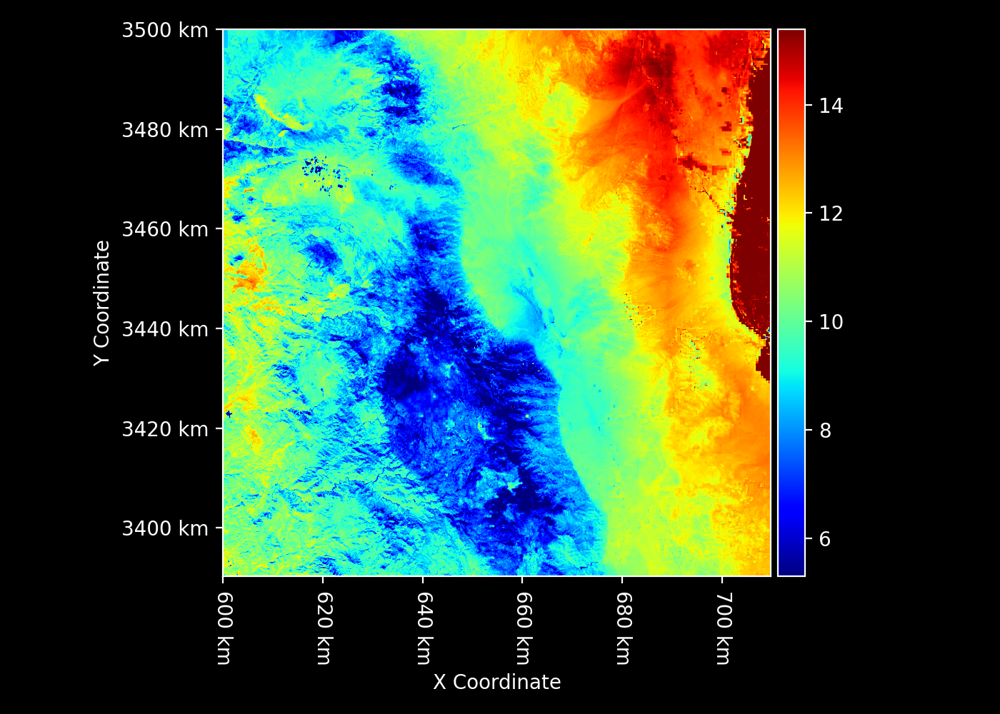

In [34]:

logger.info(f"dew-point temperature regression: Td_C = {Td_C_intercept:0.2f} + {ST_C_Td_C_coef:0.2f} * ST_C + {NDVI_Td_C_coef:0.2f} * NDVI + {albedo_Td_C_coef:0.2f} * albedo")
Td_C_prediction = ST_C * ST_C_Td_C_coef + NDVI * NDVI_Td_C_coef + albedo * albedo_Td_C_coef + Td_C_intercept
check_distribution(Td_C_prediction, "Td_C_prediction", date_UTC, tile)
logger.info(f"up-sampling predicted dew-point temperature from {int(Td_C_prediction.cell_size)}m to {int(coarse_geometry.cell_size)}m with {upsampling} method")
Td_C_prediction_coarse = Td_C_prediction.to_geometry(coarse_geometry, resampling=upsampling)
check_distribution(Td_C_prediction_coarse, "Td_C_prediction_coarse", date_UTC, tile)
Td_C_bias_coarse = Td_C_prediction_coarse - Td_C_coarse
check_distribution(Td_C_bias_coarse, "Td_C_bias_coarse", date_UTC, tile)
logger.info(f"down-sampling dew-point temperature bias from {int(Td_C_bias_coarse.cell_size)}m to {int(geometry.cell_size)}m with {downsampling} method")
Td_C_bias_smooth = Td_C_bias_coarse.to_geometry(geometry, resampling=downsampling)
check_distribution(Td_C_bias_smooth, "Td_C_bias_smooth", date_UTC, tile)
logger.info("bias-correcting dew-point temperature")
Td_C = Td_C_prediction - Td_C_bias_smooth
check_distribution(Td_C, "Td_C", date_UTC, tile)
Td_C_smooth = GEOS5FP_connection.Td_C(time_UTC=time_UTC, geometry=geometry, resampling=downsampling)
check_distribution(Td_C_smooth, "Td_C_smooth", date_UTC, tile)
logger.info("gap-filling dew-point temperature")
Td_C = rt.where(np.isnan(Td_C), Td_C_smooth, Td_C)
check_distribution(Td_C, "Td_C", date_UTC, tile)
logger.info(f"up-sampling final dew-point temperature from {int(Td_C.cell_size)}m to {int(coarse_geometry.cell_size)}m with {upsampling} method")
Td_C_final_coarse = Td_C.to_geometry(coarse_geometry, resampling=upsampling)
check_distribution(Td_C_final_coarse, "Td_C_final_coarse", date_UTC, tile)
Td_C_error_coarse = Td_C_final_coarse - Td_C_coarse
check_distribution(Td_C_error_coarse, "Td_C_error_coarse", date_UTC, tile)
logger.info(f"down-sampling dew-point temperature error from {int(Td_C_error_coarse.cell_size)}m to {int(geometry.cell_size)}m with {downsampling} method")
Td_C_error = Td_C_error_coarse.to_geometry(geometry, resampling=downsampling)
check_distribution(Td_C_error, "Td_C_error", date_UTC, tile)
Td_C

In [35]:
SM_model = sklearn.linear_model.LinearRegression()
SM_model.fit(coarse_samples[["ST_C", "NDVI", "albedo"]], coarse_samples["SM"])
SM_intercept = SM_model.intercept_
ST_C_SM_coef, NDVI_SM_coef, albedo_SM_coef = SM_model.coef_
SM_intercept, ST_C_SM_coef, NDVI_SM_coef, albedo_SM_coef

(0.5886746, -0.0077833002, -0.6376449, -0.5899521)

[2022-06-15 17:23:55 INFO] soil moisture regression: SM = 0.59 + -0.01 * ST_C + -0.64 * NDVI + -0.59 * albedo
[2022-06-15 17:23:55 INFO] variable SM_prediction on 2021-04-19 at 11RPQ min: 0.000 mean: 0.055 max: 1.000 nan: 0.10% (nan)
[2022-06-15 17:23:55 INFO] up-sampling predicted soil moisture from 70m to 13720m with average method
[2022-06-15 17:23:55 INFO] variable SM_prediction_coarse on 2021-04-19 at 11RPQ min: 0.001 mean: 0.055 max: 0.419 nan: 0.00% (nan)
[2022-06-15 17:23:55 INFO] variable SM_bias_coarse on 2021-04-19 at 11RPQ min: -0.177 mean: 0.006 max: 0.092 nan: 0.00% (nan)
[2022-06-15 17:23:55 INFO] down-sampling soil moisture bias from 13720m to 70m with linear method
[2022-06-15 17:23:55 INFO] variable SM_bias_smooth on 2021-04-19 at 11RPQ min: -0.177 mean: 0.006 max: 0.092 nan: 0.00% (nan)
[2022-06-15 17:23:55 INFO] bias-correcting soil moisture
[2022-06-15 17:23:56 INFO] variable SM on 2021-04-19 at 11RPQ min: 0.000 mean: 0.053 max: 1.000 nan: 0.10% (nan)
[2022-06-15 1

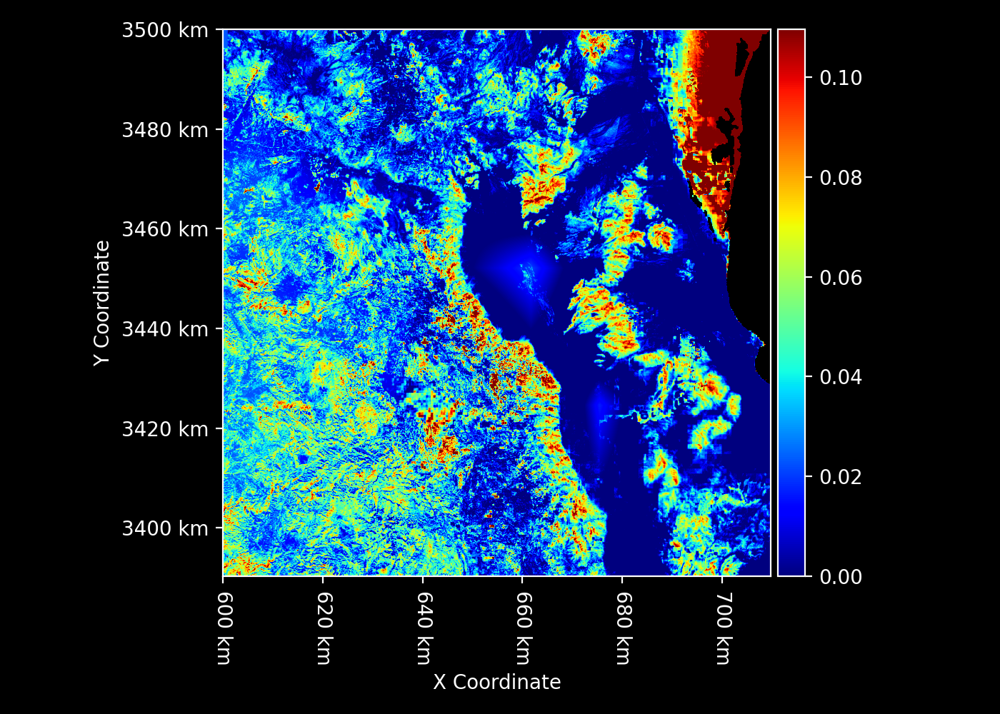

In [71]:
logger.info(f"soil moisture regression: SM = {SM_intercept:0.2f} + {ST_C_SM_coef:0.2f} * ST_C + {NDVI_SM_coef:0.2f} * NDVI + {albedo_SM_coef:0.2f} * albedo")
# SM_prediction = rt.where(water, 1, rt.clip(ST_C * ST_C_SM_coef + NDVI * NDVI_SM_coef + albedo * albedo_SM_coef + SM_intercept, 0, 1))
SM_prediction = rt.clip(ST_C * ST_C_SM_coef + NDVI * NDVI_SM_coef + albedo * albedo_SM_coef + SM_intercept, 0, 1)
check_distribution(SM_prediction, "SM_prediction", date_UTC, tile)
logger.info(f"up-sampling predicted soil moisture from {int(SM_prediction.cell_size)}m to {int(coarse_geometry.cell_size)}m with {upsampling} method")
SM_prediction_coarse = SM_prediction.to_geometry(coarse_geometry, resampling=upsampling)
check_distribution(SM_prediction_coarse, "SM_prediction_coarse", date_UTC, tile)
SM_bias_coarse = SM_prediction_coarse - SM_coarse
check_distribution(SM_bias_coarse, "SM_bias_coarse", date_UTC, tile)
logger.info(f"down-sampling soil moisture bias from {int(SM_bias_coarse.cell_size)}m to {int(geometry.cell_size)}m with {downsampling} method")
SM_bias_smooth = SM_bias_coarse.to_geometry(geometry, resampling=downsampling)
check_distribution(SM_bias_smooth, "SM_bias_smooth", date_UTC, tile)
logger.info("bias-correcting soil moisture")
# SM = rt.where(water, 1, rt.clip(SM_prediction - SM_bias_smooth, 0, 1))
SM = rt.clip(SM_prediction - SM_bias_smooth, 0, 1)
check_distribution(SM, "SM", date_UTC, tile)
SM_smooth = GEOS5FP_connection.SM(time_UTC=time_UTC, geometry=geometry, resampling=downsampling)
check_distribution(SM_smooth, "SM_smooth", date_UTC, tile)
logger.info("gap-filling soil moisture")
SM = rt.clip(rt.where(np.isnan(SM), SM_smooth, SM), 0, 1)
SM = rt.where(water, np.nan, SM)
check_distribution(SM, "SM", date_UTC, tile)
logger.info(f"up-sampling final soil moisture from {int(SM.cell_size)}m to {int(coarse_geometry.cell_size)}m with {upsampling} method")
SM_final_coarse = SM.to_geometry(coarse_geometry, resampling=upsampling)
check_distribution(SM_final_coarse, "SM_final_coarse", date_UTC, tile)
SM_error_coarse = SM_final_coarse - SM_coarse
check_distribution(SM_error_coarse, "SM_error_coarse", date_UTC, tile)
logger.info(f"down-sampling soil moisture error from {int(SM_error_coarse.cell_size)}m to {int(geometry.cell_size)}m with {downsampling} method")
SM_error = rt.where(water, np.nan, SM_error_coarse.to_geometry(geometry, resampling=downsampling))
check_distribution(SM_error, "SM_error", date_UTC, tile)
SM

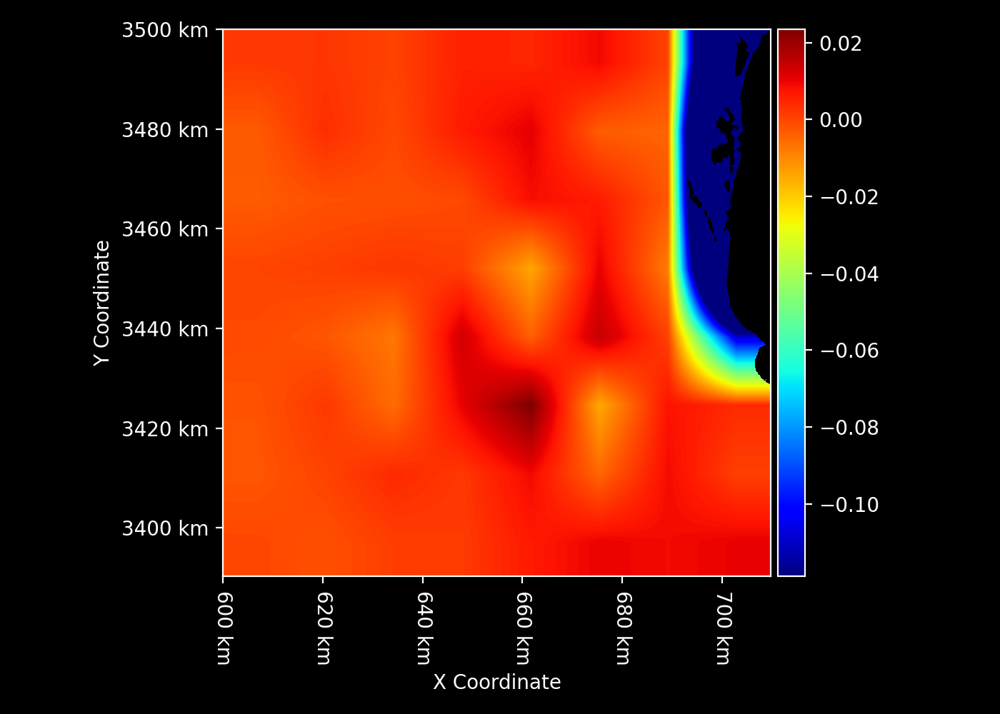

In [65]:
SM_error

In [62]:
# logger.info(f"soil moisture regression: SM = {SM_intercept:0.2f} + {ST_C_SM_coef:0.2f} * ST_C + {NDVI_SM_coef:0.2f} * NDVI + {albedo_SM_coef:0.2f} * albedo")
# SM_prediction = rt.where(water, np.nan, rt.clip(ST_C * ST_C_SM_coef + NDVI * NDVI_SM_coef + albedo * albedo_SM_coef + SM_intercept, 0, 1))
# check_distribution(SM_prediction, "SM_prediction", date_UTC, tile)
# logger.info(f"up-sampling predicted soil moisture from {int(SM_prediction.cell_size)}m to {int(coarse_geometry.cell_size)}m with {upsampling} method")
# SM_prediction_coarse = SM_prediction.to_geometry(coarse_geometry, resampling=upsampling)
# check_distribution(SM_prediction_coarse, "SM_prediction_coarse", date_UTC, tile)
# SM_bias_coarse = rt.where(coarse_water, np.nan, SM_prediction_coarse - SM_coarse)
# check_distribution(SM_bias_coarse, "SM_bias_coarse", date_UTC, tile)
# logger.info(f"down-sampling soil moisture bias from {int(SM_bias_coarse.cell_size)}m to {int(geometry.cell_size)}m with {downsampling} method")
# SM_bias_smooth = SM_bias_coarse.to_geometry(geometry, resampling=downsampling)
# check_distribution(SM_bias_smooth, "SM_bias_smooth", date_UTC, tile)
# logger.info("bias-correcting soil moisture")
# SM = rt.where(water, np.nan, rt.clip(SM_prediction - SM_bias_smooth, 0, 1))
# check_distribution(SM, "SM", date_UTC, tile)
# SM_smooth = GEOS5FP_connection.SM(time_UTC=time_UTC, geometry=geometry, resampling=downsampling)
# check_distribution(SM_smooth, "SM_smooth", date_UTC, tile)
# logger.info("gap-filling soil moisture")
# SM = rt.clip(rt.where(np.isnan(SM), SM_smooth, SM), 0, 1)
# check_distribution(SM, "SM", date_UTC, tile)
# logger.info(f"up-sampling final soil moisture from {int(SM.cell_size)}m to {int(coarse_geometry.cell_size)}m with {upsampling} method")
# SM_final_coarse = SM.to_geometry(coarse_geometry, resampling=upsampling)
# check_distribution(SM_final_coarse, "SM_final_coarse", date_UTC, tile)
# SM_error_coarse = rt.where(coarse_water, np.nan, SM_final_coarse - SM_coarse)
# check_distribution(SM_error_coarse, "SM_error_coarse", date_UTC, tile)
# logger.info(f"down-sampling soil moisture error from {int(SM_error_coarse.cell_size)}m to {int(geometry.cell_size)}m with {downsampling} method")
# SM_error = SM_error_coarse.to_geometry(geometry, resampling=downsampling)
# check_distribution(SM_error, "SM_error", date_UTC, tile)
# SM

[2022-06-15 17:06:33 INFO] retrieving top layer soil moisture from GEOS-5 FP tavg1_2d_lnd_Nx SFMC for 2021-04-19 21:58 UTC
[2022-06-15 17:06:33 INFO] searching GEOS-5 FP tavg1_2d_lnd_Nx at 2021-04-19 21:58:59 UTC
[2022-06-15 17:06:42 INFO] GEOS-5 FP file found: /Users/halverso/data/ECOSTRESS_test_runs/15801_013/L3T_L4T_JET_sources/GEOS5FP_download/2021.04.19/GEOS.fp.asm.tavg1_2d_lnd_Nx.20210419_2130.V01.nc4
[2022-06-15 17:06:42 INFO] GEOS-5 FP working directory: /Users/halverso/data/ECOSTRESS_test_runs/15801_013
[2022-06-15 17:06:42 INFO] GEOS-5 FP products directory: /Users/halverso/data/ECOSTRESS_test_runs/15801_013/GEOS5FP_products
[2022-06-15 17:06:42 INFO] GEOS-5 FP file found: /Users/halverso/data/ECOSTRESS_test_runs/15801_013/L3T_L4T_JET_sources/GEOS5FP_download/2021.04.19/GEOS.fp.asm.tavg1_2d_lnd_Nx.20210419_2230.V01.nc4
[2022-06-15 17:06:42 INFO] GEOS-5 FP working directory: /Users/halverso/data/ECOSTRESS_test_runs/15801_013
[2022-06-15 17:06:42 INFO] GEOS-5 FP products direct

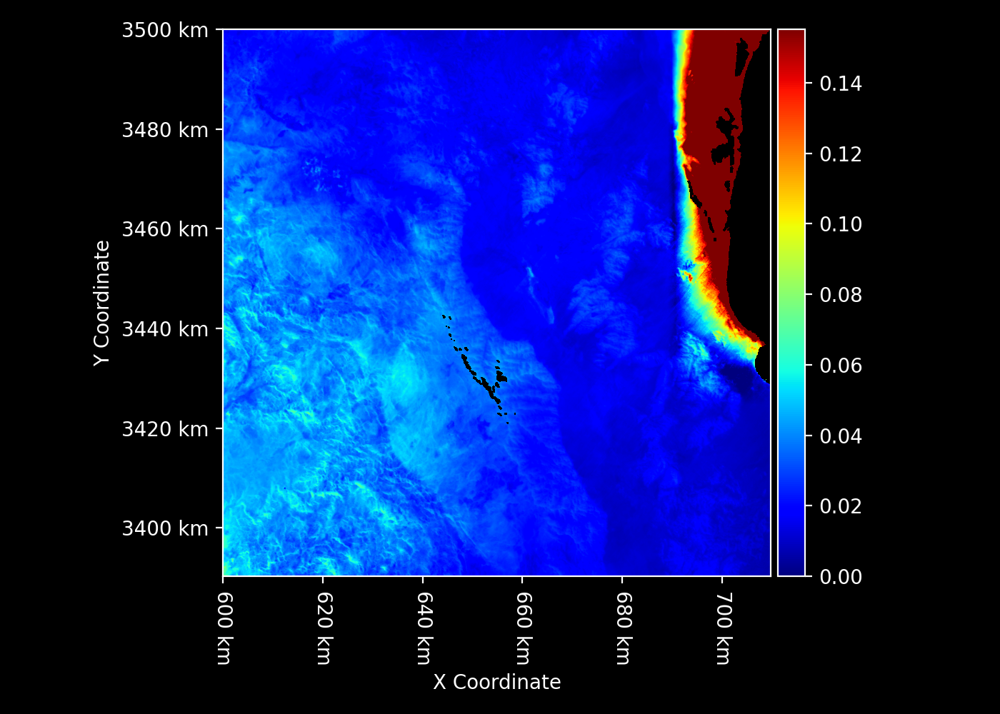

In [70]:
ST_fine = ST_C
SM_resampled = GEOS5FP_connection.SM(time_UTC=time_UTC, geometry=geometry, resampling=downsampling)
target = tile
NDVI_fine = NDVI
ST_fine = ST_fine.mask(~water)
fvlim=0.5,
a=0.5
check_distribution(ST_fine, "ST_fine", date_UTC=date_UTC, target=target)
NDVI_fine = NDVI_fine.mask(~water)
check_distribution(NDVI_fine, "NDVI_fine", date_UTC=date_UTC, target=target)
FVC_fine = NDVI_to_FVC(NDVI_fine)
check_distribution(FVC_fine, "FVC_fine", date_UTC=date_UTC, target=target)
soil_fine = FVC_fine < fvlim
check_distribution(soil_fine, "soil_fine", date_UTC=date_UTC, target=target)
Tmin_coarse = ST_fine.to_geometry(coarse_geometry, resampling="min")
check_distribution(Tmin_coarse, "Tmin_coarse", date_UTC=date_UTC, target=target)
Tmax_coarse = ST_fine.to_geometry(coarse_geometry, resampling="max")
check_distribution(Tmax_coarse, "Tmax_coarse", date_UTC=date_UTC, target=target)
Ts_fine = ST_fine.mask(soil_fine)
check_distribution(Ts_fine, "Ts_fine", date_UTC=date_UTC, target=target)
Tsmin_coarse = Ts_fine.to_geometry(coarse_geometry, resampling="min").fill(Tmin_coarse)
check_distribution(Tsmin_coarse, "Tsmin_coarse", date_UTC=date_UTC, target=target)
Tsmax_coarse = Ts_fine.to_geometry(coarse_geometry, resampling="max").fill(Tmax_coarse)
check_distribution(Tsmax_coarse, "Tsmax_coarse", date_UTC=date_UTC, target=target)
ST_coarse = ST_fine.to_geometry(coarse_geometry, resampling="average")
check_distribution(ST_coarse, "ST_coarse", date_UTC=date_UTC, target=target)
SEE_coarse = (Tsmax_coarse - ST_coarse) / rt.clip(Tsmax_coarse - Tsmin_coarse, 1, None)
check_distribution(SEE_coarse, "SEE_coarse", date_UTC=date_UTC, target=target)
SM_SEE_proportion = (SM_coarse / SEE_coarse).to_geometry(geometry, resampling=downsampling)
check_distribution(SM_SEE_proportion, "SM_SEE_proportion", date_UTC=date_UTC, target=target)
Tsmax_fine = Tsmax_coarse.to_geometry(geometry, resampling=downsampling)
check_distribution(Tsmax_fine, "Tsmax_fine", date_UTC=date_UTC, target=target)
Tsrange_fine = (Tsmax_coarse - Tsmin_coarse).to_geometry(geometry, resampling=downsampling)
check_distribution(Tsrange_fine, "Tsrange_fine", date_UTC=date_UTC, target=target)
SEE_fine = (Tsmax_fine - ST_fine) / rt.clip(Tsrange_fine, 1, None)
check_distribution(SEE_fine, "SEE_fine", date_UTC=date_UTC, target=target)
SEE_mean = SEE_coarse.to_geometry(geometry, resampling=downsampling)
check_distribution(SEE_mean, "SEE_mean", date_UTC=date_UTC, target=target)
SM_fine = rt.clip(SM_resampled + a * SM_SEE_proportion * (SEE_fine - SEE_mean), 0, 1)
SM_fine = SM_fine.mask(~water)
check_distribution(SM_fine, "SM_fine", date_UTC=date_UTC, target=target)
SM_fine

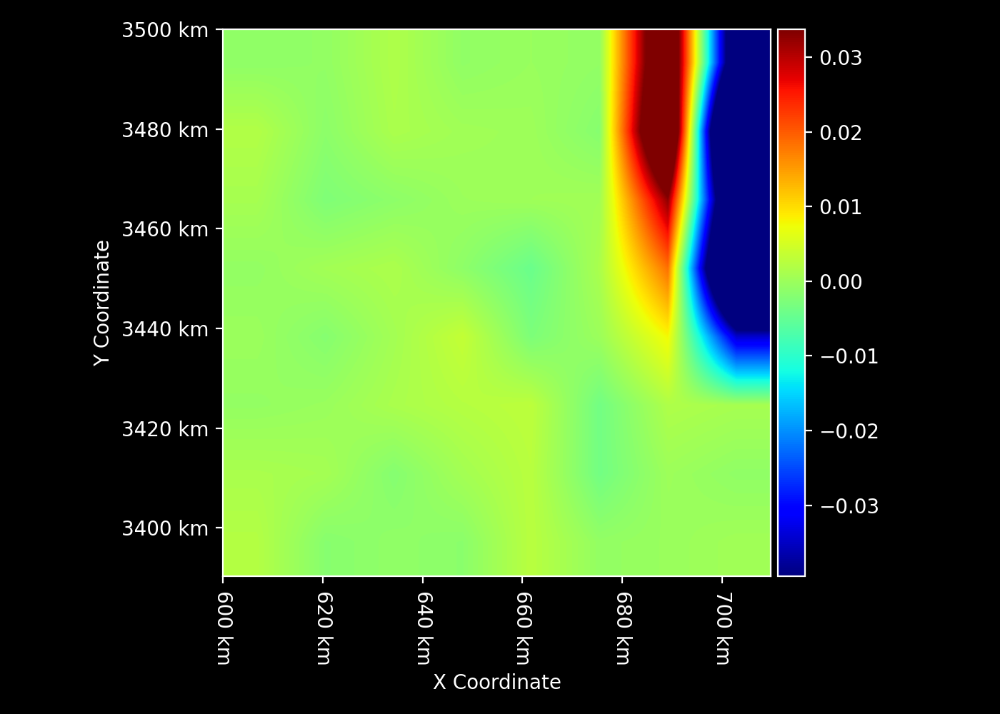

In [73]:
SM_error_andreas = (SM_fine.to_geometry(coarse_geometry, resampling=upsampling) - SM_coarse).to_geometry(geometry, resampling=downsampling)
SM_error_andreas

In [75]:
np.nanmedian(SM_error_andreas - SM_error)

-0.0010645536

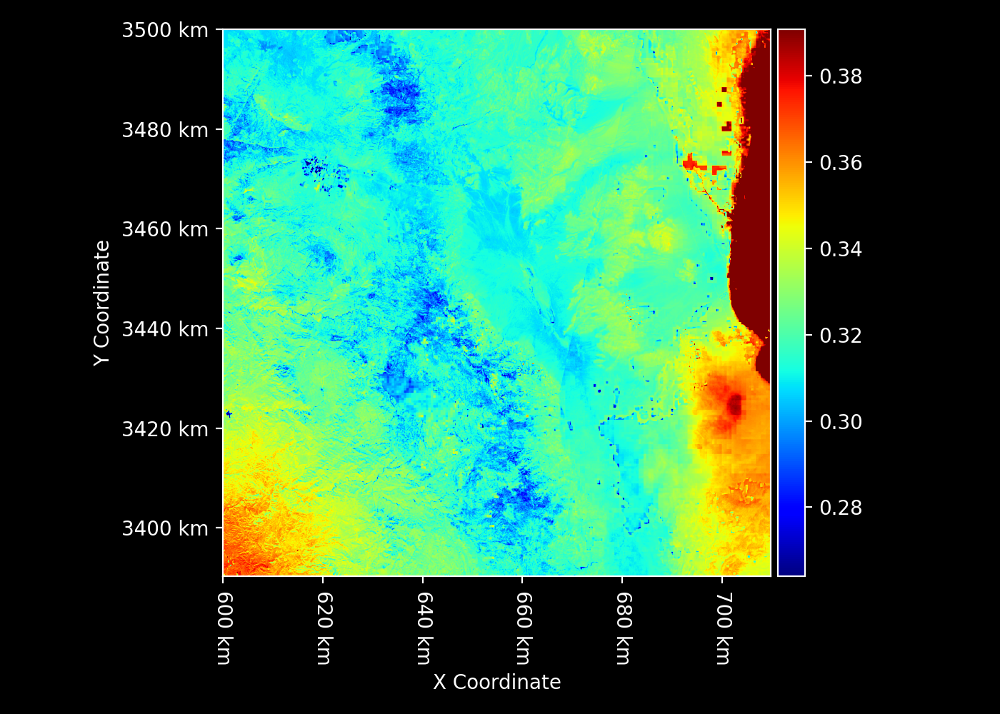

In [76]:
RH = rt.clip(np.exp((17.625 * Td_C)/(243.04 + Td_C))/np.exp((17.625 * Ta_C)/(243.04 + Ta_C)), 0 ,1)
RH